**Customer Churn Prediction**

An overview of the customer churn prediction and dataset:

Churn: Customer left the service within last month.

All the columns of the dataset represent the customer telecom data including customer account information (personal demographic info also) and differnt types of services consumed.

The various attributes of the dataset can help us analyze the factors responsible for customer churn behavior and prediction.

From a business persepctive, it is necessary to analyze the customer churn rate, and attributes relevant to the churn, leading to reassessment of the business model and increasing profitability.

**Business Understanding and Impact**


---


Especially the telecom industry is plagued by a high churn rate. An average churn rate of 31% has been reported for the year 2021 and beyond. Higher churn rates leads to loss in profits of the company and higher investment in user aquisition, leading to reduced investments into long term strategised product developments and innovations. Overall, churn is a big issue in the telecom industry and needs to be  solved by implementing impactful solutions such as churn prediction and analyzing the attributes relevant to it and taking focused actions based on the insights gained.

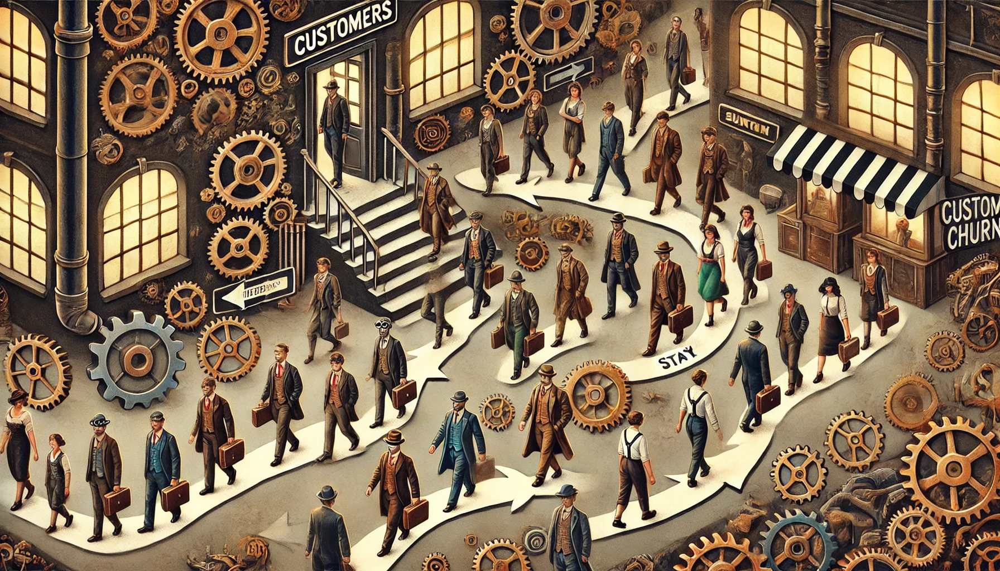

In [524]:
from IPython.display import Image
Image("customer_churn.png")

In [1]:
!pwd

/Users/yatharth/Documents/RND4IMPACT/Projects


Load the dataset from Kaggle:

In [2]:
# %conda install kaggle

In [2]:
# permission setting of API
# !chmod 600 /root/.kaggle/kaggle.json

In [ ]:
!pwd

In [4]:
# import kaggle Done!!

# # !kaggle datasets download -d blastchar/telco-customer-churn
# # Example: Download dataset
# kaggle.api.dataset_download_files('blastchar/telco-customer-churn', path='/Users/yatharth/', unzip=True)

Dataset URL: https://www.kaggle.com/datasets/blastchar/telco-customer-churn


In [3]:
!ls

Customer_churn_prediction.ipynb      WA_Fn-UseC_-Telco-Customer-Churn.csv


In [1]:
import pandas as pd  # type: ignore
# import numpy
# Load the dataset
df = pd.read_csv("WA_Fn-UseC_-Telco-Customer-Churn.csv")

In [2]:
df.head(5)

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [3]:
# Checking data type of columns.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [ ]:
# dtype of Totalcharges can be changed to float type for descriptive statistical calculations ahead (as correct data type lead efficient memory usage, and operations accuracy ).

df["TotalCharges"] = df["TotalCharges"].astype(float)
df["TotalCharges"].dtype

#Doesn't work

Doesn't work suggesting that there might be some NaN, or non-numeric values, or even might be some character spacing issue in the TotalCharges column due to which the astype function fails.
Thus, need to use pd.to_numeric to convert the values to float type by using coerce method to look for any NaN, or non-numeric values and converting them to NaN explicitly and then deal with the newly declared Nan values.

In [6]:
pd.to_numeric(df['TotalCharges'], errors='coerce').isna().sum()

11

11 (~0.2%) Nan values exist in this case which was leading to errors on using astype. That is why to_numeric is beneficial as it has built in flexibility to deal with errors in conversions. As the amount of Nan values is insignificant in comparison to the total count, we can drop the values rather than imputing.

In [7]:
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df['TotalCharges'].dtype

dtype('float64')

In [8]:
# Drop NaN values from the 'TotalCharges' column and update the DataFrame
df = df.dropna(subset=['TotalCharges'])

In [9]:
df["TotalCharges"].isna().sum()

0

In [10]:
# Missing value check for the dataset
for col in df:
   print(f'{col}:{df[col].isnull().mean()*100}%')

customerID:0.0%
gender:0.0%
SeniorCitizen:0.0%
Partner:0.0%
Dependents:0.0%
tenure:0.0%
PhoneService:0.0%
MultipleLines:0.0%
InternetService:0.0%
OnlineSecurity:0.0%
OnlineBackup:0.0%
DeviceProtection:0.0%
TechSupport:0.0%
StreamingTV:0.0%
StreamingMovies:0.0%
Contract:0.0%
PaperlessBilling:0.0%
PaymentMethod:0.0%
MonthlyCharges:0.0%
TotalCharges:0.0%
Churn:0.0%


Missing value analysis showcases that all columns have 0% NULL values. Thus, we can process further with the experimentation

In [11]:
# Checking for columns containing unique values, gives better understanding of the columns, like there significance, and also tells about if they might be categorical or numerical variables.
for i in df.columns:
    print(f"{df[i].name} : {df[i].nunique()}")
    
  #  if df[i].nunique() > 10:
  #     print(df[i].name)

customerID : 7032
gender : 2
SeniorCitizen : 2
Partner : 2
Dependents : 2
tenure : 72
PhoneService : 2
MultipleLines : 3
InternetService : 3
OnlineSecurity : 3
OnlineBackup : 3
DeviceProtection : 3
TechSupport : 3
StreamingTV : 3
StreamingMovies : 3
Contract : 3
PaperlessBilling : 2
PaymentMethod : 4
MonthlyCharges : 1584
TotalCharges : 6530
Churn : 2


In [12]:
# Drop customer_id as it is not conrtibuting feature to our analysis, its an unique record indentifier feature.

df.drop('customerID', axis=1, inplace=True)

In [13]:
# Lets make a list for cat and num columns for any specific feature engineering tasks required ahead like feature encoding, or scaling. 
# Also helps us identify the normal and ordinal col in cat cols.
num_col = [col for col in df if df[col].dtypes != object]
num_col

# num_col =  df.select_dtypes(include = 'object').columns
# num_col

['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges']

In [14]:
# df['SeniorCitizen'] = df['SeniorCitizen'].astype('category')
# print(df['SeniorCitizen'].dtype)

In [15]:
num_col.remove('SeniorCitizen')
num_col

['tenure', 'MonthlyCharges', 'TotalCharges']

Now further we will create categorical columns based on the data type, unique values and manual inspection. We can observe from initial inspection of data that few columns such as gender, dependents, etc, in the dataset are binary categories and can be converted into binary numerical form. Thus, in the code below, we check the categorical columns along with the unique values, to make list of columns to be converted and observe other categories as well. 

In [16]:
# df_cat = df.loc[:,df[num_col]]
# df_cat = df[df.columns.difference(num_col)]

cat_col =  df.select_dtypes(include = 'object').columns
text_to_convert = [] # store columns which are binary and can be converted to binary numerical form (0&1)
text_list = ['Yes', 'Male', 'No', "Female"] # observed binary categories 

print("Categorical Columns and their Unique Values and if there are any binary categories (which can be converted): \n")

for col in cat_col:
    unique_val = set(df[col].unique()) # create a set of unqiue value in each column to extract the category values to observe
    print(f'Unique val in {col}: {unique_val} & {df[col].nunique()}')
    if len(unique_val) == 2 and unique_val.issubset(text_list): #checks for textual binary data and stores in list
        text_to_convert.append(col)
        print("To be converted:", col)    #insights :get dummy to do feature encoding and binary text category conversion at once

Categorical Columns and their Unique Values and if there are any binary categories (which can be converted): 

Unique val in gender: {'Female', 'Male'} & 2
To be converted: gender
Unique val in Partner: {'No', 'Yes'} & 2
To be converted: Partner
Unique val in Dependents: {'No', 'Yes'} & 2
To be converted: Dependents
Unique val in PhoneService: {'No', 'Yes'} & 2
To be converted: PhoneService
Unique val in MultipleLines: {'No phone service', 'No', 'Yes'} & 3
Unique val in InternetService: {'Fiber optic', 'No', 'DSL'} & 3
Unique val in OnlineSecurity: {'No', 'Yes', 'No internet service'} & 3
Unique val in OnlineBackup: {'No', 'Yes', 'No internet service'} & 3
Unique val in DeviceProtection: {'No', 'Yes', 'No internet service'} & 3
Unique val in TechSupport: {'No', 'Yes', 'No internet service'} & 3
Unique val in StreamingTV: {'No', 'Yes', 'No internet service'} & 3
Unique val in StreamingMovies: {'No', 'Yes', 'No internet service'} & 3
Unique val in Contract: {'Two year', 'One year', 'Mont

In [17]:
# These are the text binary values that can be converted into binary numerical data directly for ML models
df[text_to_convert]


,gender,Partner,Dependents,PhoneService,PaperlessBilling,Churn
0,Female,Yes,No,No,Yes,No
1,Male,No,No,Yes,No,No
2,Male,No,No,Yes,Yes,Yes
3,Male,No,No,No,No,No
4,Female,No,No,Yes,Yes,Yes
...,...,...,...,...,...,...
7038,Male,Yes,Yes,Yes,Yes,No
7039,Female,Yes,Yes,Yes,Yes,No
7040,Female,Yes,Yes,No,Yes,No
7041,Male,Yes,No,Yes,Yes,Yes


In [18]:
# Create a copy before column preprocessing to cat col for analysis further.
da_df = df.copy()

In [19]:
# Lets convert the binary textual format categorical data to binary numerical format for ML models input
text_rep = {'Yes': 1, 'No': 0, 'Male':1, 'Female':0}
for col in text_to_convert:
    df[col] = df[col].replace(text_rep)


df.head(4)

/var/folders/qf/skvw9ygx6hnddqy1kk2pswtc0000gn/T/ipykernel_17828/4214575276.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].replace(text_rep)


,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,0,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,1,Electronic check,29.85,29.85,0
1,1,0,0,0,34,1,No,DSL,Yes,No,Yes,No,No,No,One year,0,Mailed check,56.95,1889.50,0
2,1,0,0,0,2,1,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,1,Mailed check,53.85,108.15,1
3,1,0,0,0,45,0,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,0,Bank transfer (automatic),42.30,1840.75,0


In [20]:
# Checking the number of category values for columns apart from binary cat columns, especially to check if there are significant values for columns containing
#  Yes/No and a third category which is No internet service. If not internet servive value count was too low, we could make a different strategy to move ahead.
mul_cat = df[cat_col][df[cat_col].columns.difference(text_to_convert)] # Also collecting the left over categorical columns needed to one hot encoded ahead:
# df_cat = df[df.columns.difference(num_col)]
for col in mul_cat:
    print(df[col].value_counts(normalize=True))

Contract
Month-to-month    0.551052
Two year          0.239619
One year          0.209329
Name: proportion, dtype: float64
DeviceProtection
No                     0.439989
Yes                    0.343857
No internet service    0.216155
Name: proportion, dtype: float64
InternetService
Fiber optic    0.440273
DSL            0.343572
No             0.216155
Name: proportion, dtype: float64
MultipleLines
No                  0.481371
Yes                 0.421928
No phone service    0.096701
Name: proportion, dtype: float64
OnlineBackup
No                     0.438993
Yes                    0.344852
No internet service    0.216155
Name: proportion, dtype: float64
OnlineSecurity
No                     0.497298
Yes                    0.286547
No internet service    0.216155
Name: proportion, dtype: float64
PaymentMethod
Electronic check             0.336320
Mailed check                 0.228100
Bank transfer (automatic)    0.219283
Credit card (automatic)      0.216297
Name: proportion, dtype:

Thus now we can make our ordinal and normal column list, for feature encoding. But on observing the cat colum data frame, we can confirm that no ordinal columns are present. Thus all the categorical columns present in the data frame can be directly used for onehot encoding.  

In [21]:
cat_col_ohe = mul_cat.copy()
cat_col_ohe

,Contract,DeviceProtection,InternetService,MultipleLines,OnlineBackup,OnlineSecurity,PaymentMethod,StreamingMovies,StreamingTV,TechSupport
0,Month-to-month,No,DSL,No phone service,Yes,No,Electronic check,No,No,No
1,One year,Yes,DSL,No,No,Yes,Mailed check,No,No,No
2,Month-to-month,No,DSL,No,Yes,Yes,Mailed check,No,No,No
3,One year,Yes,DSL,No phone service,No,Yes,Bank transfer (automatic),No,No,Yes
4,Month-to-month,No,Fiber optic,No,No,No,Electronic check,No,No,No
...,...,...,...,...,...,...,...,...,...,...
7038,One year,Yes,DSL,Yes,No,Yes,Mailed check,Yes,Yes,Yes
7039,One year,Yes,Fiber optic,Yes,Yes,No,Credit card (automatic),Yes,Yes,No
7040,Month-to-month,No,DSL,No phone service,No,Yes,Electronic check,No,No,No
7041,Month-to-month,No,Fiber optic,Yes,No,No,Mailed check,No,No,No


## **Analyzing Data**

In [20]:
# Checking the descriptive statistics of the numerical columns in the data, such as the 
da_df[num_col].describe()

,tenure,MonthlyCharges,TotalCharges
count,7032.000000,7032.000000,7032.000000
mean,32.421786,64.798208,2283.300441
std,24.545260,30.085974,2266.771362
min,1.000000,18.250000,18.800000
25%,9.000000,35.587500,401.450000
50%,29.000000,70.350000,1397.475000
75%,55.000000,89.862500,3794.737500
max,72.000000,118.750000,8684.800000


In [21]:
# Checking the basic stats of the multiple category columns:
mul_cat.describe()


,Contract,DeviceProtection,InternetService,MultipleLines,OnlineBackup,OnlineSecurity,PaymentMethod,StreamingMovies,StreamingTV,TechSupport
count,7032,7032,7032,7032,7032,7032,7032,7032,7032,7032
unique,3,3,3,3,3,3,4,3,3,3
top,Month-to-month,No,Fiber optic,No,No,No,Electronic check,No,No,No
freq,3875,3094,3096,3385,3087,3497,2365,2781,2809,3472


array([[<Axes: title={'center': 'tenure'}>,
        <Axes: title={'center': 'MonthlyCharges'}>],
       [<Axes: title={'center': 'TotalCharges'}>, <Axes: >]], dtype=object)

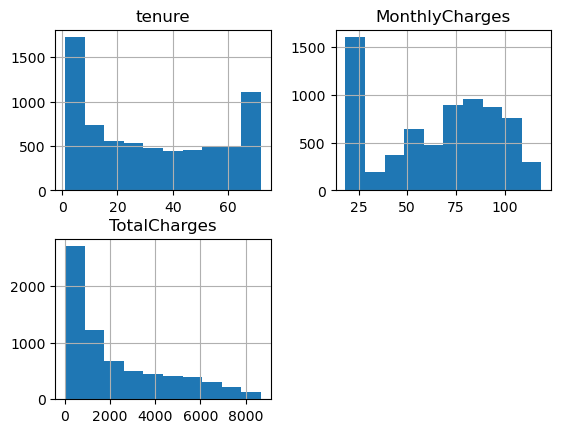

In [22]:
da_df[num_col].hist()

Correlation Plot for Numerical Columns

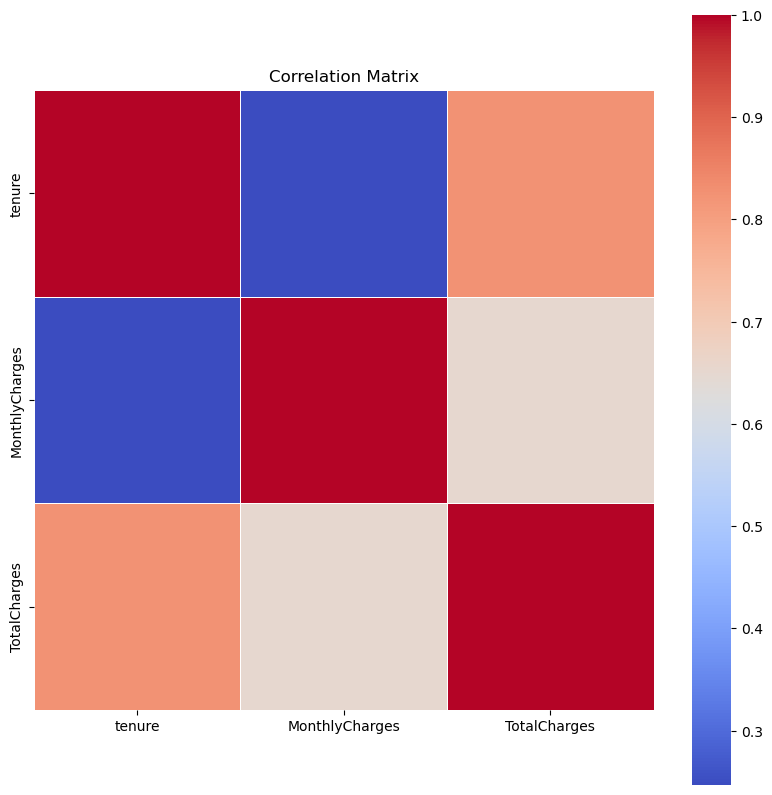

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt
corr_matrix = da_df[num_col].corr()
plt.figure(figsize=(10, 10))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', square=True, linewidths=.5)
plt.title('Correlation Matrix')
plt.show()


We can observe positive correlation between the Total Charges and tenure which is understandable as the more the customer stays with the company more will be the total charge, and negative correlation between monthly charges and tenure. (Where tenure is the amount of time customer has stayed with the company.)

In [31]:
import plotly.io as pio
pio.renderers.default = "notebook_connected+png"

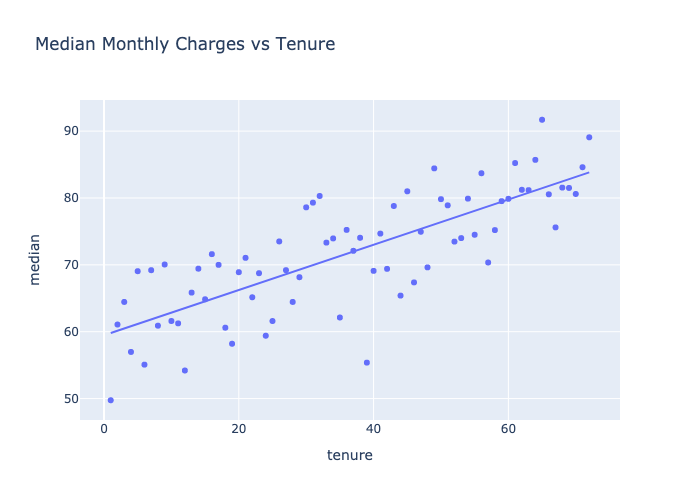

In [32]:
import plotly.express as px

# da_df[num_col]
mvt = da_df[num_col].groupby("tenure")['MonthlyCharges'].agg(["mean", "median"]).reset_index()
fig = px.scatter(mvt, x='tenure', y='median', trendline= 'ols', hover_data=['mean'],
                 title='Median Monthly Charges vs Tenure')#, labels={'mean': 'Mean Rating', 'count': 'Number of Reviews'})
fig.show()

From the above we can observe a linear relationship between the average monthly charges and the tenure of the customer, and indicating the charges increase as the customer tenure increases. 

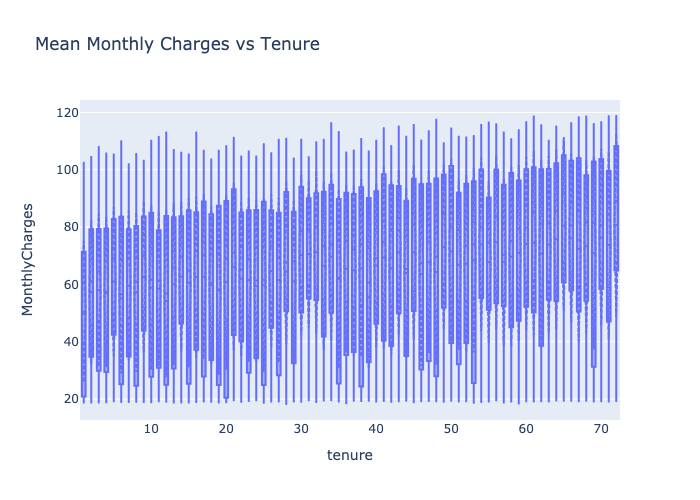

In [33]:
# test_df.groupby("tenure")['MonthlyCharges'].median().reset_index()
# df.groupby('tenure')['MonthlyCharges']
fig = px.box(da_df, x='tenure', y='MonthlyCharges',
                 title='Mean Monthly Charges vs Tenure')#, labels={'mean': 'Mean Rating', 'count': 'Number of Reviews'})
fig.update_traces(boxmean='sd')
fig.show()

The high correlation between the Tenure and Total Charges can be seen in the graphs below:

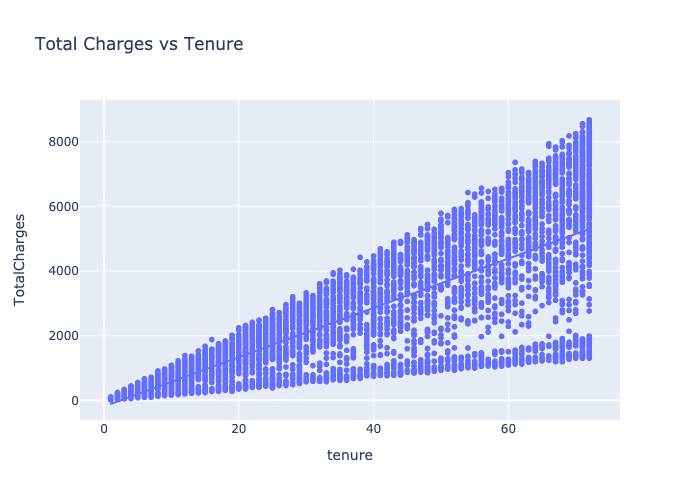

In [34]:
fig = px.scatter(da_df, x='tenure', y='TotalCharges', trendline="ols",
                 title='Total Charges vs Tenure')#, labels={'mean': 'Mean Rating', 'count': 'Number of Reviews'})
fig.show()

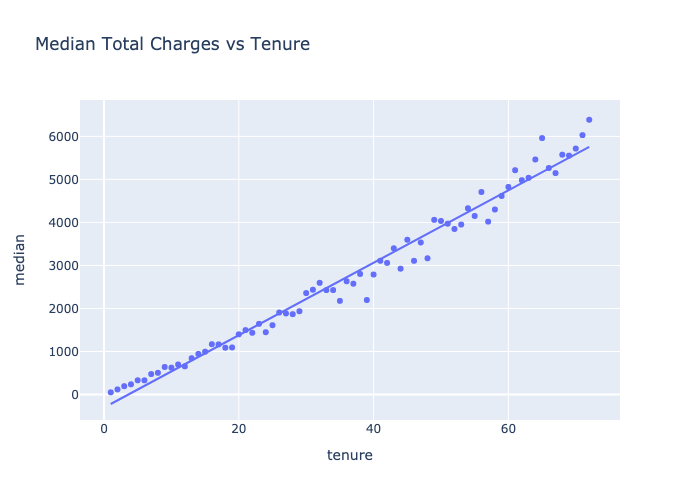

In [35]:
mvt = da_df[num_col].groupby("tenure")['TotalCharges'].agg(["mean", "median"]).reset_index()
fig = px.scatter(mvt, x='tenure', y='median', trendline= 'ols', hover_data=['mean'],
                 title='Median Total Charges vs Tenure')#, labels={'mean': 'Mean Rating', 'count': 'Number of Reviews'})
fig.show()

In [36]:
# Manually trying to calculate the mean and median of tenure and Monthly charges against Churn, but Boxplot does that directly for you.

# cvt = da_df.groupby('Churn').agg({"MonthlyCharges":['mean','median'],'tenure':['mean','median']}).reset_index()
# fig = px.histogram(da_df, x='Churn', y='TotalCharges', 
#                  title='Total Charges vs Tenure')#, labels={'mean': 'Mean Rating', 'count': 'Number of Reviews'})
# fig.show()

# cvt.columns = ['_'.join(col).strip() for col in cvt.columns.values]
# for col in cvt.columns.values:
#     print('_'.join(col).strip())

# Group by 'Churn' and aggregate with new column names
# cvt = da_df.groupby('Churn').agg(
#     MonthlyCharges_Mean=('MonthlyCharges', 'mean'),
#     MonthlyCharges_Median=('MonthlyCharges', 'median'),
#     Tenure_Mean=('tenure', 'mean'),
#     Tenure_Median=('tenure', 'median')
# ).reset_index()


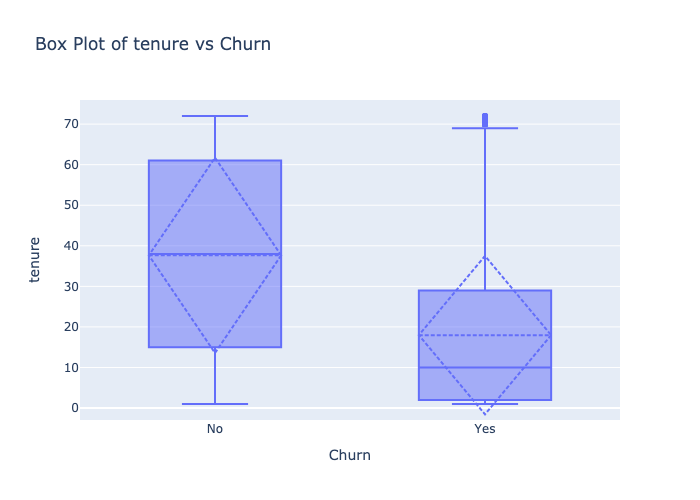

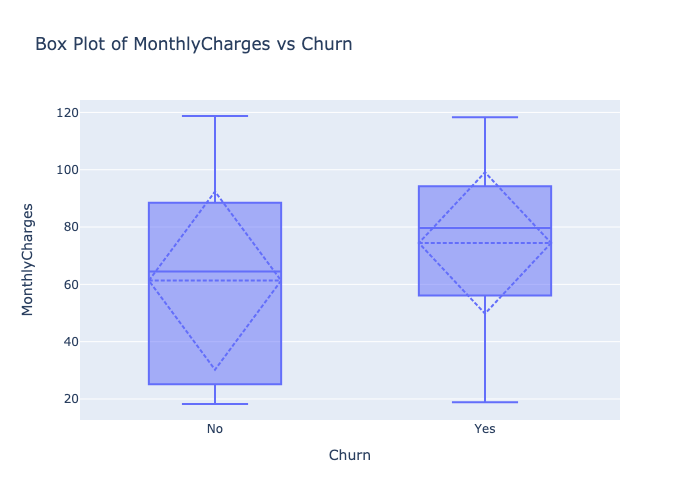

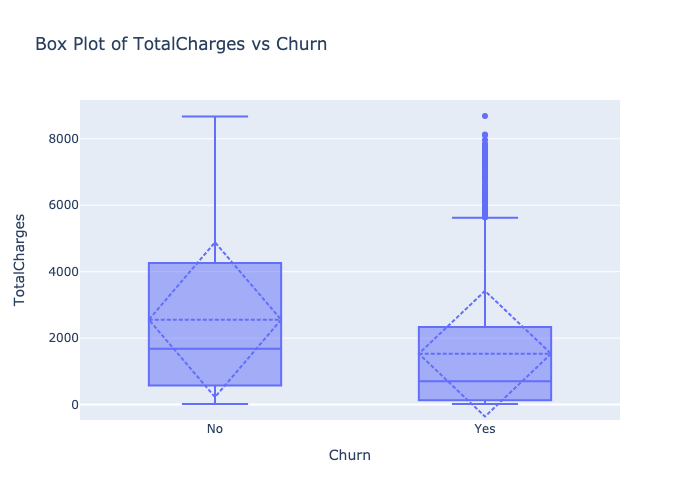

In [37]:
for col in da_df[num_col]:
 
    fig = px.box(da_df,x ='Churn' ,y=col, title=f'Box Plot of {col} vs Churn')
    fig.update_traces(boxmean='sd')
    fig.show()
   

From the analysis, we observe that newer customers are more likely to churn, particularly those facing higher monthly charges early in their service. The box plot reveals that churned customers have significantly shorter tenures and higher median monthly charges (around $80) compared to non-churned customers. Additionally, the scatter plot indicates that while monthly charges generally increase with tenure for all customers, churned customers experience unusually high charges early on, deviating from the expected trend. This suggests that high initial charges could be a key factor contributing to customer churn.


From the above we can observe the trend depicted by the correlation plot of positive correlation, i.e., the total charges increase as the tenure of a customer increase. (Can also oberve from the trend line based on *Ordinary Least Squares regression trendline*)

Class distribtution for each category for the categorical feature and the target categories below:

## Using Plotly

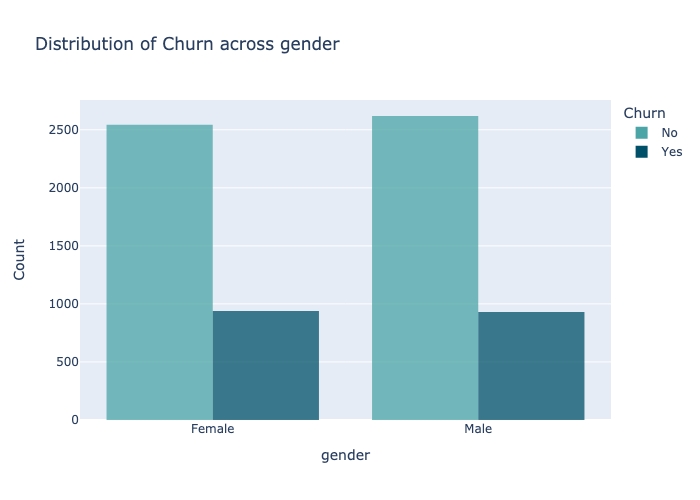

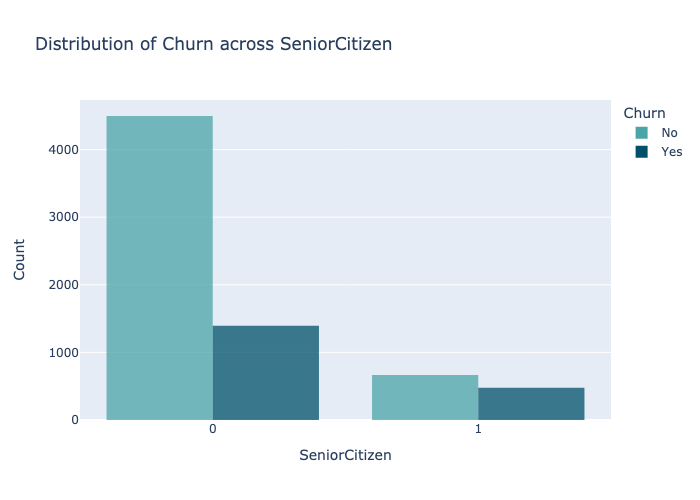

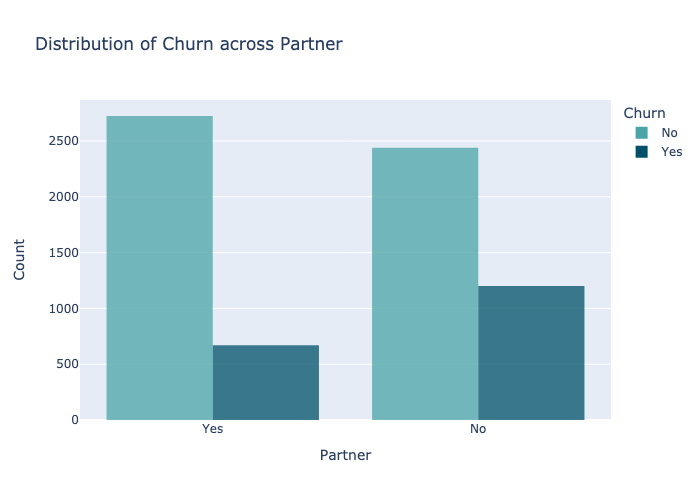

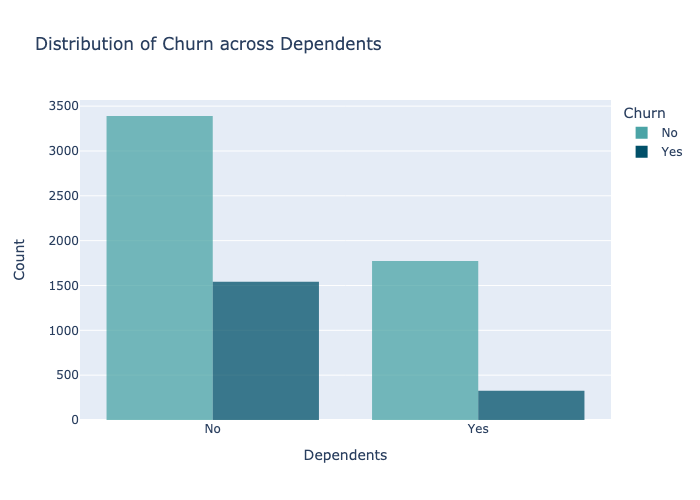

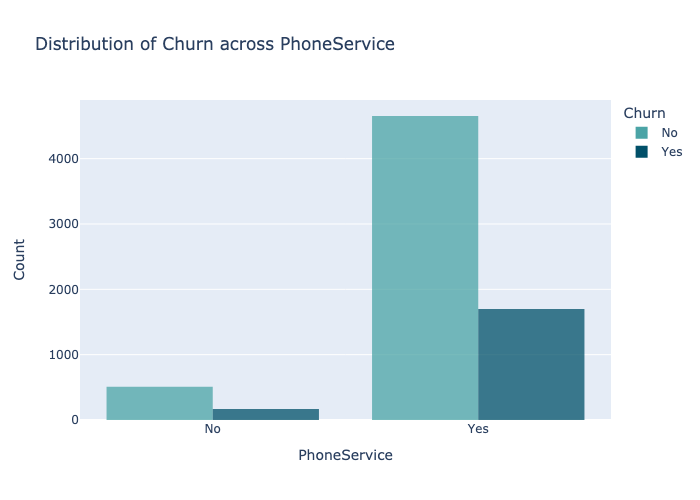

...

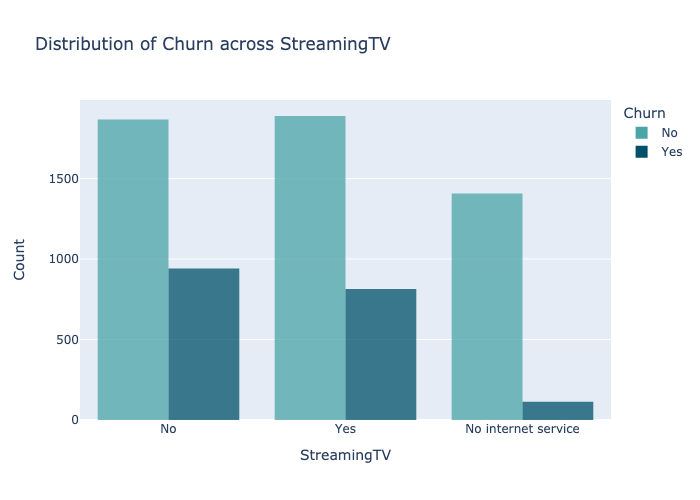

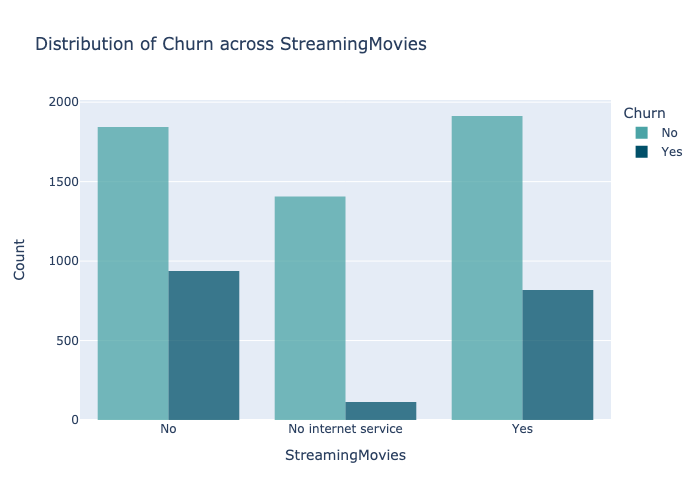

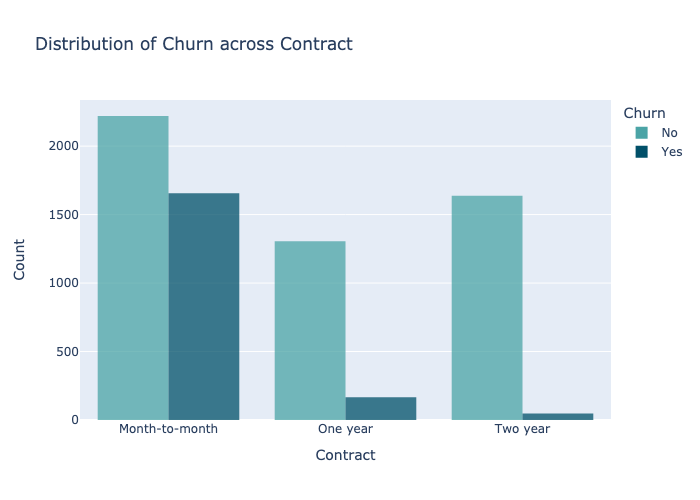

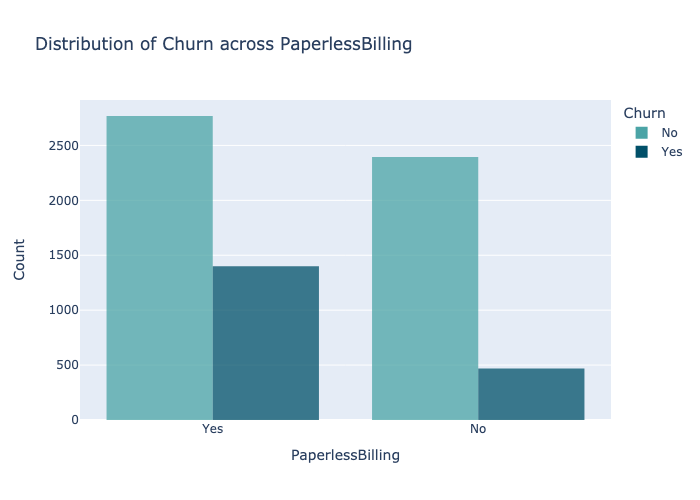

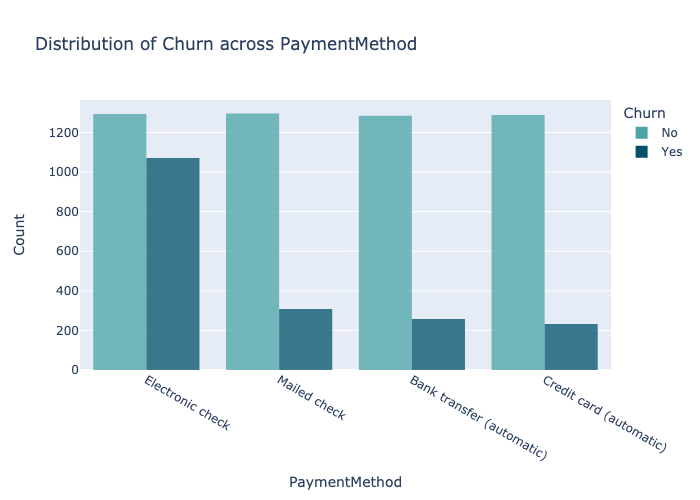

In [38]:
import plotly.express as px

# Define the categorical features
cat_cols = [
    'gender', 'SeniorCitizen', 'Partner', 'Dependents', 
    'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
    'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
    'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod'
]
colors = ['#4BA4A6','#015069'] 
# Loop through each categorical feature and create the bar plot
for feature in cat_cols:
    fig = px.histogram(da_df, x=feature, color='Churn',
                       title=f"Distribution of Churn across {feature}",
                       labels={feature: feature, "count": "Count"},
                       barmode='group', color_discrete_sequence=colors,
                       opacity=0.75)
    fig.update_layout(xaxis_title=feature, yaxis_title='Count')
    fig.show()


## Using Seaborn

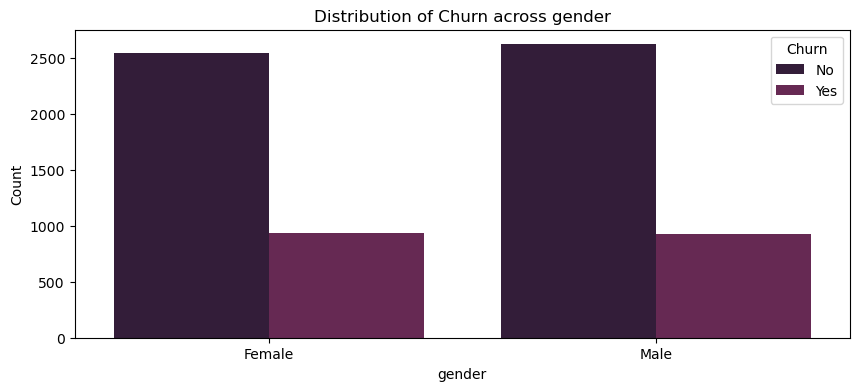

/opt/homebrew/Caskroom/miniconda/base/envs/dsproj/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/homebrew/Caskroom/miniconda/base/envs/dsproj/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



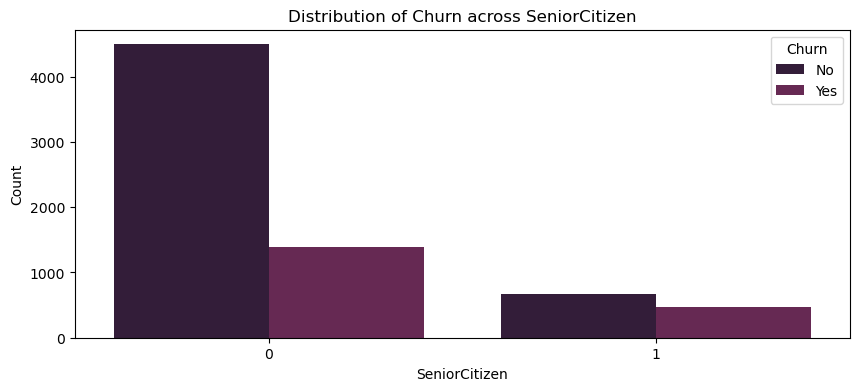

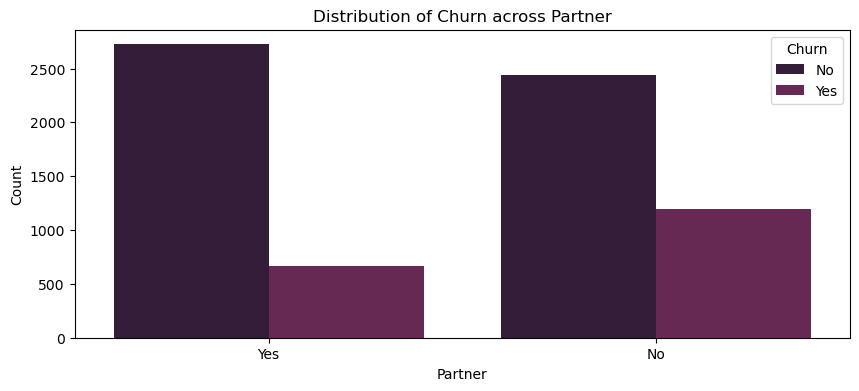

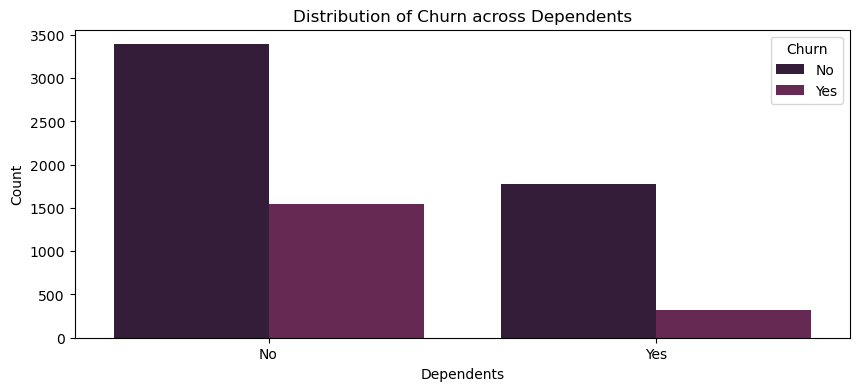

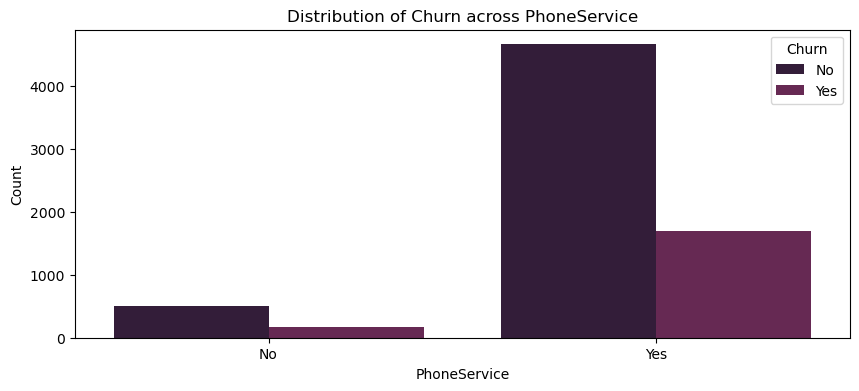

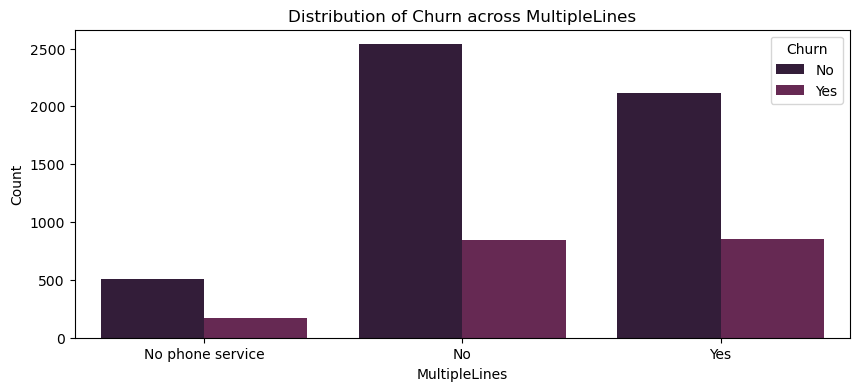

...

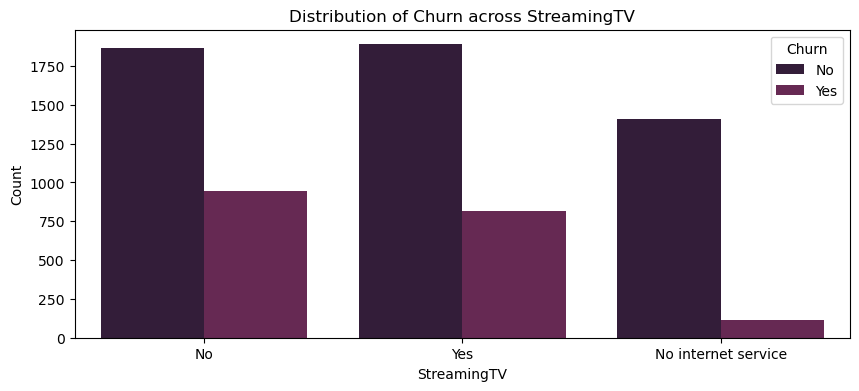

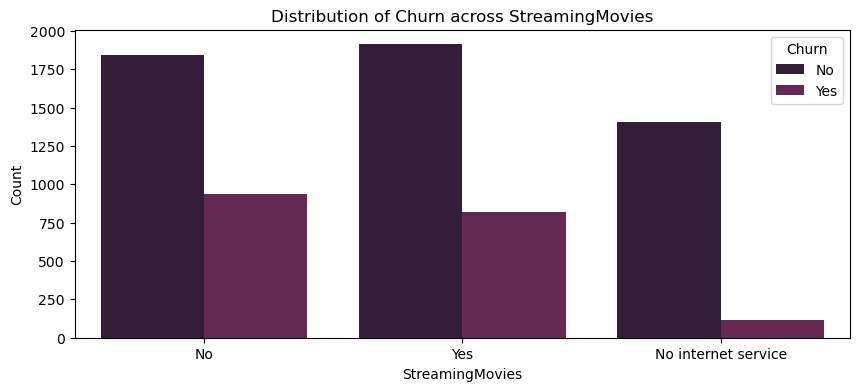

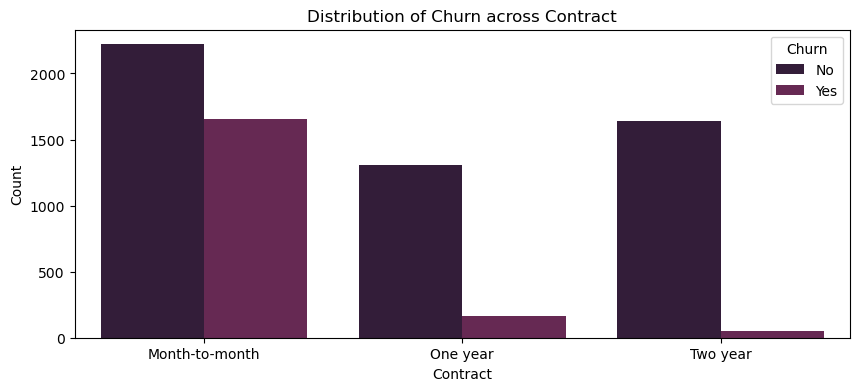

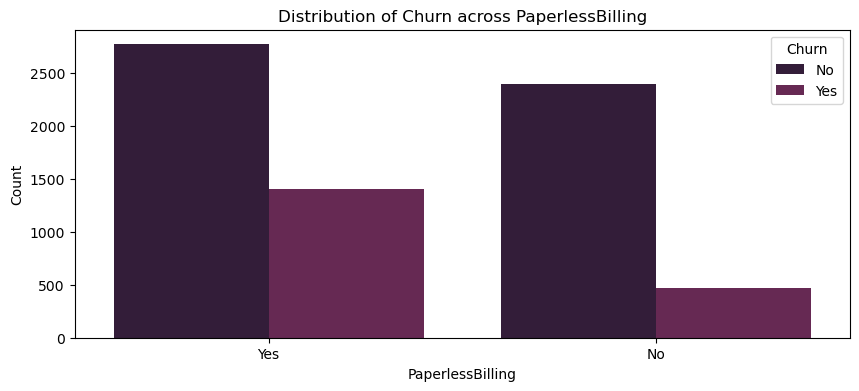

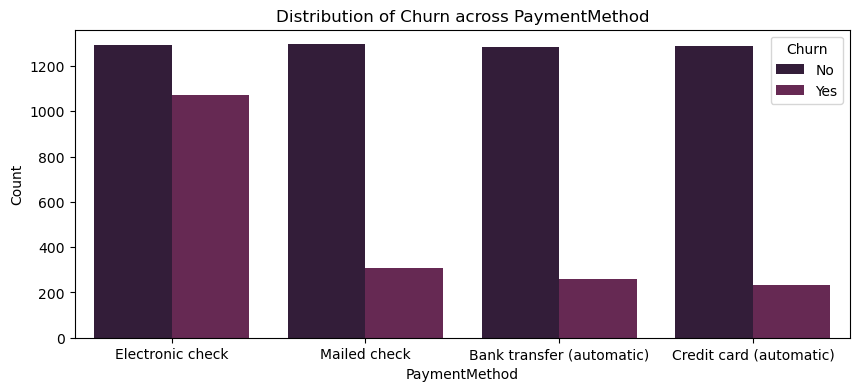

In [263]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_palette('rocket')
# Define the categorical features
cat_cols = ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod']
# Loop through each categorical feature and create the bar plot
for feature in cat_cols:
       plt.figure(figsize=(10, 4))
       sns.countplot(x=feature, hue='Churn', data=da_df) 
       plt.title(f"Distribution of Churn across {feature}") 
       plt.xlabel(feature)
       plt.ylabel("Count")
       plt.legend(title='Churn', loc='upper right') 
       plt.show()

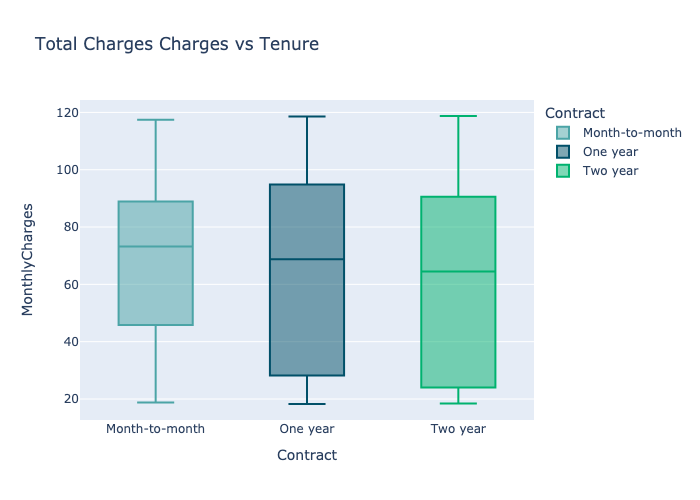

In [39]:
color = ['#4BA4A6','#015069', '#00b26f'] 
fig = px.box(df, x='Contract', y='MonthlyCharges', color='Contract',
                 title='Total Charges Charges vs Tenure', color_discrete_sequence= color)#, labels={'mean': 'Mean Rating', 'count': 'Number of Reviews'})
fig.show()


Shorter contract customers have higher monthly charges, thus also having higher churn which positively supports our hypothesis of customer churning in the early stages of tenure due to high month-month charges which can also be due to the customer mentality of initially joining with month-to-month contract and gradually when the  prices seem more, they leave the service. 

The month-month contract provides more freedom to the customer to test the service for value to their money, and the freedom to leave!

Now lets check the distribution of the target variable

In [294]:
df["Churn"].describe()

count    7032.000000
mean        0.265785
std         0.441782
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: Churn, dtype: float64

In [295]:
df["Churn"].value_counts(normalize= True)*100

Churn
0    73.421502
1    26.578498
Name: proportion, dtype: float64

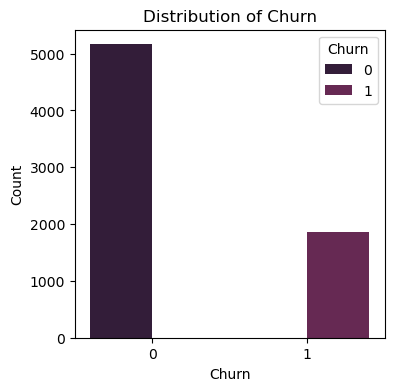

In [296]:
plt.figure(figsize=(4, 4))
sns.countplot(x="Churn", hue='Churn', data=df) 
plt.title(f"Distribution of Churn") 
plt.xlabel('Churn')
plt.ylabel("Count")
plt.legend(title='Churn', loc='upper right') 
plt.show()

We can observe class imbalance in the dataset which can lead to inducing bias in the model for the larger class, i.e., "No" in this case. 
Thus we need to formulate train-test split strategy accordingly. 

In cases where there is a class imbalance in the target variable (i.e., one class is significantly more frequent than the other), it is often recommended to use stratified sampling when splitting the data into training and testing sets. Stratified sampling ensures that the proportion of each class is preserved in both the training and testing sets, which can help prevent biased results. 


In [475]:
from sklearn.model_selection import train_test_split


X = df.drop('Churn', axis=1)  # 'Churn' is the target variable
y = df['Churn']

# Splitting the data with stratification
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y)


In [476]:
#just checking

print("Shape of Training features:", X_train.shape)
print("Shape of Training target:", y_train.shape)
print("Shape of Testing features:", X_test.shape)
print("Shape of Testing target:", y_test.shape)

Shape of Training features: (5625, 19)
Shape of Training target: (5625,)
Shape of Testing features: (1407, 19)
Shape of Testing target: (1407,)


In [477]:
# from sklearn.preprocessing import RobustScaler
# # from sklearn.preprocessing import MinMaxScaler
# norm = RobustScaler()
# X_train[num_col] = scaler.fit_transform(X_train[num_col])
# # transform the test on the train scale
# X_test[num_col] = scaler.transform(X_test[num_col])

## MinMaxScaler Usage

The `MinMaxScaler` from Scikit-Learn is used to scale features to a given range, usually between 0 and 1, or between any two values specified by the user. This type of scaling compresses all the features to a specific range and is useful in cases where the algorithms are sensitive to the magnitude of variables. This method is often preferred for neural networks and algorithms that compute weights based on distance metrics.

### When to Use MinMaxScaler
**Distribution Consideration:** `MinMaxScaler` is particularly useful when the data does not follow a Gaussian distribution. This scaler can be preferable in scenarios where standardization (scaling to a mean of zero and a standard deviation of one) might not be suitable due to the presence of outliers or a non-Gaussian distribution of the data.


### `fit_transform()`
**What It Does:** This method is used during the training phase. It calculates the minimum (Min) and maximum (Max) values of each feature in the training data. Then, it uses these parameters to transform the training data such that each feature is scaled to the [0, 1] range using the formula:

\[ X_{\text{scaled}} = \frac{X - \text{Min}}{\text{Max} - \text{Min}} \]

This transformation shifts and rescales the data into the range [0, 1].

**When and Why It's Used:** `fit_transform()` is applied to the training data to calculate the range parameters (Min and Max for each feature) and to transform the training data accordingly. This standardization of features to a common scale without distorting differences in the ranges of values is crucial for many machine learning algorithms, especially those that rely on distance computations.

### `transform()`
**What It Does:** Similar to `fit_transform()`, but this method uses the Min and Max values computed from the training dataset to scale other datasets. It ensures that the transformation applies the exact same scaling effect to new data as it did to the training data.

**When and Why It's Used:** `transform()` is applied to the test data or any new data that is fed into the model after the training process. This ensures that all data input into the model has the same feature scale, which is critical for algorithms that are sensitive to variations in input scale. Using the training data’s parameters prevents information leakage and maintains consistency across predictions or data comparisons.

### Important Note
While `MinMaxScaler` is excellent for normalizing features, it can be sensitive to outliers. Since it scales the data within the range defined by the minimum and maximum values, extreme outliers can compress the majority of the data into a very narrow range, potentially distorting the relationships among data points.

Limitations: Highly sensitive to outliers, which can skew the range and compress majority of data into a narrow interval.


In [429]:
from sklearn.preprocessing import MinMaxScaler
norm = MinMaxScaler
X_train[num_col] = scaler.fit_transform(X_train[num_col])
# transform the test on the train scale
X_test[num_col] = scaler.transform(X_test[num_col])

## StandardScaler Usage (Just for note) Although not used here as num cols are not normally distributed (skewed and have bimodal data distribution)

The `StandardScaler` from Scikit-Learn is used to standardize features by removing the mean and scaling to unit variance, which is a common requirement for many machine learning algorithms. The methods `fit_transform()` and `transform()` play crucial roles in this process:

### `fit_transform()`
**What It Does:** This method is used during the training phase. It calculates the mean (μ) and standard deviation (σ) of each feature in the training data. Then, it uses these parameters to scale the training data such that each feature will have zero mean and unit variance (Basically Z score standardisation). The formula used is:

\[ X_{\text{scaled}} = \frac{X - \mu}{\sigma} \]

**When and Why It's Used:** `fit_transform()` is applied to the training data to both calculate the scaling parameters (μ and σ for each feature) and to transform the training data according to these parameters. It's crucial to use this method on the training data to ensure that the model learns with standardized features, which helps many algorithms perform better (e.g., algorithms that use Euclidean distance, like K-means, or models like linear regression and logistic regression that assume normally distributed features).

### `transform()`
**What It Does:** This method is used on the test data or any new data that is fed into the model after training. It uses the mean and standard deviation calculated from the training dataset to scale other datasets. Importantly, it does not recalculate new parameters for the new data; it strictly uses the parameters from the training data.

**When and Why It's Used:** `transform()` is applied to the test data or new data to ensure that the scaling applied matches exactly with that of the training data. This consistency is critical *because the model trained on the scaled training data expects input data to be similarly scaled*. **Using the training data’s parameters prevents information leakage and ensures a fair comparison or prediction.**


In [430]:
# Not performed
# from sklearn.preprocessing import StandardScaler
# # Standardize the feature matrices
# scaler = StandardScaler()
# X_train[num_col] = scaler.fit_transform(X_train[num_col])
# # transform the test on the train scale
# X_test[num_col] = scaler.transform(X_test[num_col])

array([[<Axes: title={'center': 'tenure'}>,
        <Axes: title={'center': 'MonthlyCharges'}>],
       [<Axes: title={'center': 'TotalCharges'}>, <Axes: >]], dtype=object)

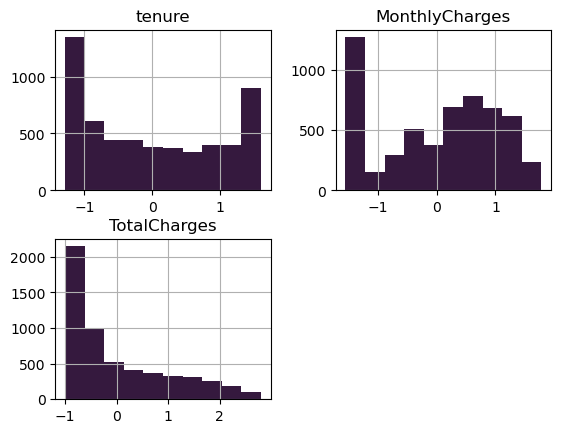

In [478]:
X_train[num_col].hist()

### One-Hot encoding the categorical features

In [479]:
X_train[cat_col_ohe.columns]

,Contract,DeviceProtection,InternetService,MultipleLines,OnlineBackup,OnlineSecurity,PaymentMethod,StreamingMovies,StreamingTV,TechSupport
1413,Two year,Yes,Fiber optic,Yes,Yes,Yes,Credit card (automatic),No,No,Yes
7003,Month-to-month,Yes,DSL,No phone service,No,No,Electronic check,No,No,Yes
3355,Two year,Yes,Fiber optic,Yes,Yes,No,Credit card (automatic),No,No,Yes
4494,Month-to-month,No,Fiber optic,No,Yes,No,Electronic check,Yes,No,No
3541,Month-to-month,No,DSL,No phone service,No,Yes,Bank transfer (automatic),No,Yes,No
...,...,...,...,...,...,...,...,...,...,...
3451,One year,No,Fiber optic,No,No,No,Bank transfer (automatic),No,No,No
5123,Month-to-month,No,Fiber optic,No,Yes,No,Credit card (automatic),No,No,No
4135,Two year,Yes,DSL,Yes,Yes,Yes,Credit card (automatic),Yes,Yes,Yes
4249,One year,Yes,DSL,No,Yes,No,Mailed check,Yes,No,No


In [480]:
from sklearn.preprocessing import OneHotEncoder

# Initialize the OneHotEncoder
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')  # sparse=False for easier viewing

# Fit the encoder on the training data
encoder.fit(X_train[cat_col_ohe.columns])

# Transform both the training and testing data
X_train_encoded = encoder.transform(X_train[cat_col_ohe.columns])
X_test_encoded = encoder.transform(X_test[cat_col_ohe.columns])

# Convert arrays back to DataFrames for easier handling
columns_encoded = encoder.get_feature_names_out(cat_col_ohe.columns)

# Ensure the number of columns matches the transformed data
print("Encoded array shape:", X_train_encoded.shape)
print("Number of column names:", len(columns_encoded))


X_train_encoded_df = pd.DataFrame(X_train_encoded, columns=columns_encoded, index=X_train.index)
X_test_encoded_df = pd.DataFrame(X_test_encoded, columns=columns_encoded, index=X_test.index)

X_train_final = pd.concat([X_train.drop(cat_col_ohe.columns, axis=1), X_train_encoded_df], axis=1)
X_test_final = pd.concat([X_test.drop(cat_col_ohe.columns, axis=1), X_test_encoded_df], axis=1)

# Now X_train_final and X_test_final are ready for use in machine learning models
# print(X_train_final)
# print(X_test_final)

Encoded array shape: (5625, 31)
Number of column names: 31


In [481]:
X_train_final.head(5)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Contract_Month-to-month,...,PaymentMethod_Mailed check,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes
1413,1,0,1,1,1.321816,1,0,0.981556,1.659900,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
7003,1,0,0,0,-0.267410,0,0,-0.971546,-0.562252,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
3355,0,0,1,0,1.444064,1,0,0.837066,1.756104,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4494,1,0,0,0,-1.204646,1,0,0.641092,-0.908326,1.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0
3541,0,0,1,0,0.669826,0,0,-0.808787,-0.101561,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0


In [482]:
print('Distribution of target variable in train after stratified sampling:', y_train.value_counts(normalize= True)*100)
print('Distribution of target variable in test after stratified sampling:', y_test.value_counts(normalize= True)*100)


Distribution of target variable in train after stratified sampling: Churn
0    73.422222
1    26.577778
Name: proportion, dtype: float64
Distribution of target variable in test after stratified sampling: Churn
0    73.418621
1    26.581379
Name: proportion, dtype: float64


In [483]:
#we can observe the correlation between the variables and the target variable.
#target variable doesn't have significant positive correlation with the features . 
# plt.subplots(figsize=(15, 5))
# corr_df = pd.concat([X_train_final, y_train],axis=1)
# corr_matrix = corr_df[num_col[1:]].corr()
# plt.figure(figsize=(10, 10))
# sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', square=True, linewidths=.5)
# plt.title('Correlation Matrix')
# plt.show()
# pd.concat([corr_df[columns_encoded],y_train],axis=1).corr()['Churn'].sort_values(ascending = False).plot(kind='bar')
# sns.heatmap(corr_matrix, /annot=False, fmt=".2f", cmap='coolwarm', cbar=True)
# plt.title('Correlation Matrix with Heatmap')
# plt.show()

### **Model Building and Selection**

In [484]:
# Lets begin with Logisitc Regression and hyperparamter optimization

In [485]:
# Initialize an empty DataFrame
metrics_df = []
# metrics_df = pd.DataFrame(columns=['Model', 'F1 Score', 'Accuracy'])

In [486]:
from sklearn.linear_model import LogisticRegression

# all parameters not specified are set to their defaults
lr_model = LogisticRegression()
lr_model.fit(X_train_final, y_train)

accuracy_lr = lr_model.score(X_test_final,y_test)
print("Logistic Regression accuracy is :",accuracy_lr)


Logistic Regression accuracy is : 0.8045486851457001


In [487]:
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
y_predict = lr_model.predict(X_test_final)
f1_score(y_test, y_predict)

rep = classification_report(y_test, y_predict)
print(rep)

# F1 score is a more reliable metric for this case in imbalance class and gives us robust insight into performance of our model.

              precision    recall  f1-score   support

           0       0.85      0.89      0.87      1033
           1       0.65      0.57      0.61       374

    accuracy                           0.80      1407
   macro avg       0.75      0.73      0.74      1407
weighted avg       0.80      0.80      0.80      1407



Gridsearch the best set of Hyperparamters for LR

In [488]:
# Gridsearch the best set of Hyperparamters for LR

from sklearn.model_selection import GridSearchCV

# Define a grid of hyperparameter settings to test
# param_grid = {
#     'penalty': ['l1', 'l2', 'elasticnet', 'none'],  # Regularization type.
#     'C': [0.1, 1, 10, 100],  # Inverse of regularization strength; smaller values specify stronger regularization.
#     'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],  # Algorithms to use in the optimization problem.
#     'max_iter': [100, 200, 300]  # Maximum number of iterations taken for the solvers to converge.
# }
param_grid = {
    'penalty': ['l2'],  # 'l1', 'elasticnet' might require 'saga' solver
    'C': [0.01,0.1, 1, 10],
    'solver': ['lbfgs', 'saga'],  # ensure compatibility
    'max_iter': [10000],
}
# Setup the grid search with cross-validation
grid_search = GridSearchCV(estimator=lr_model, param_grid=param_grid, cv=5, verbose= 0, scoring='f1')

# Fit grid search
best_model = grid_search.fit(X_train_final, y_train)

# View best hyperparameters
print('Best Penalty:', best_model.best_estimator_.get_params()['penalty'])
print('Best C:', best_model.best_estimator_.get_params()['C'])
print('Best solver:', best_model.best_estimator_.get_params()['solver'])
print('Best max_iter:', best_model.best_estimator_.get_params()['max_iter'])
# Predict using the best model
accuracy_lr = best_model.score(X_test_final, y_test)
y_predict = best_model.predict(X_test_final)
f1_lr = f1_score(y_test, y_predict)
print("Logistic Regression accuracy with GridSearch is:", accuracy_lr)
print("Logistic Regression F1_score with GridSearch is:", f1_lr)

Best Penalty: l2
Best C: 1
Best solver: saga
Best max_iter: 10000
Logistic Regression accuracy with GridSearch is: 0.6099290780141844
Logistic Regression F1_score with GridSearch is: 0.6099290780141844


In [489]:
metrics_df.append({'Model': 'Logistic Regression', 'F1 Score': f1_lr, 'Accuracy':accuracy_lr})

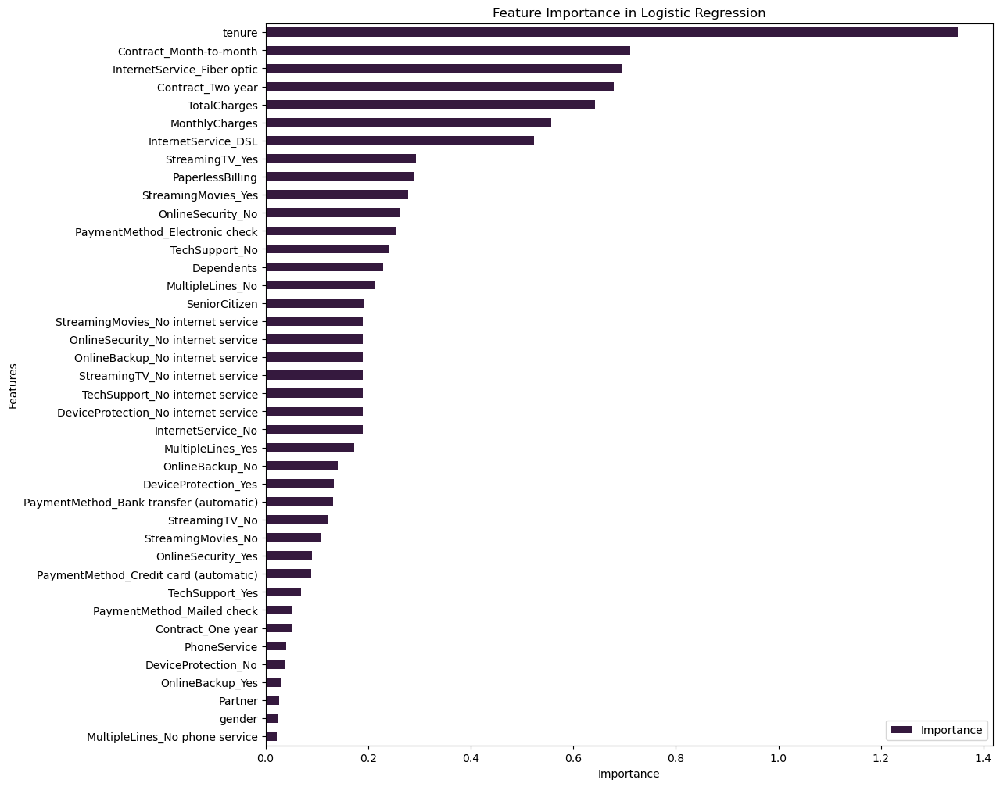

In [490]:
import numpy as np

coefficients = best_model.best_estimator_.coef_[0]  # Extract coefficients
sns.set_palette('rocket')
# Create a DataFrame for viewing feature importance
feature_importance = pd.DataFrame({
    'Feature': X_train_final.columns,  # Feature names
    'Importance': np.abs(coefficients)  # Absolute value of coefficients to measure impact
})
feature_importance = feature_importance.sort_values(by='Importance', ascending=True)

# Plotting
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(12, 12))
plt.title('Feature Importance in Logistic Regression')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()


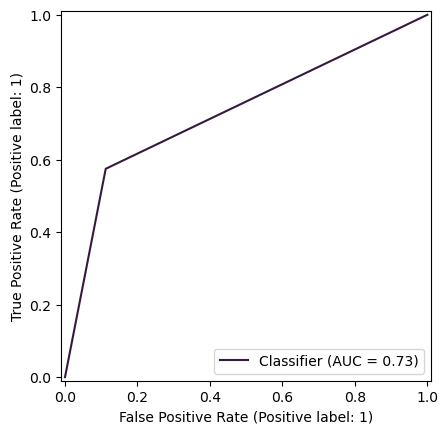

In [491]:
from sklearn.metrics import RocCurveDisplay
RocCurveDisplay.from_predictions(y_test, y_predict)


## SVM

In [492]:
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score

# Train a primal SVM model with default parameters
psm = LinearSVC()
psm.fit(X_train_final, y_train)

# predictions on the training, validation, and test sets
y_train_pred = psm.predict(X_train_final)
y_test_pred = psm.predict(X_test_final)
# accuracy on the training, validation, and test sets
train_acc = accuracy_score(y_train, y_train_pred)
test_acc_svm = accuracy_score(y_test, y_test_pred)
print("Training accuracy: {:.3f}".format(train_acc))

print("Test accuracy: {:.3f}".format(test_acc_svm))
test_f1_svm = f1_score(y_test, y_test_pred)

Training accuracy: 0.804
Test accuracy: 0.802


/opt/homebrew/Caskroom/miniconda/base/envs/dsproj/lib/python3.9/site-packages/sklearn/svm/_classes.py:31: FutureWarning:

The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.



In [493]:
print("F1_score:",f1_score(y_test, y_test_pred))

F1_score: 0.6017191977077364


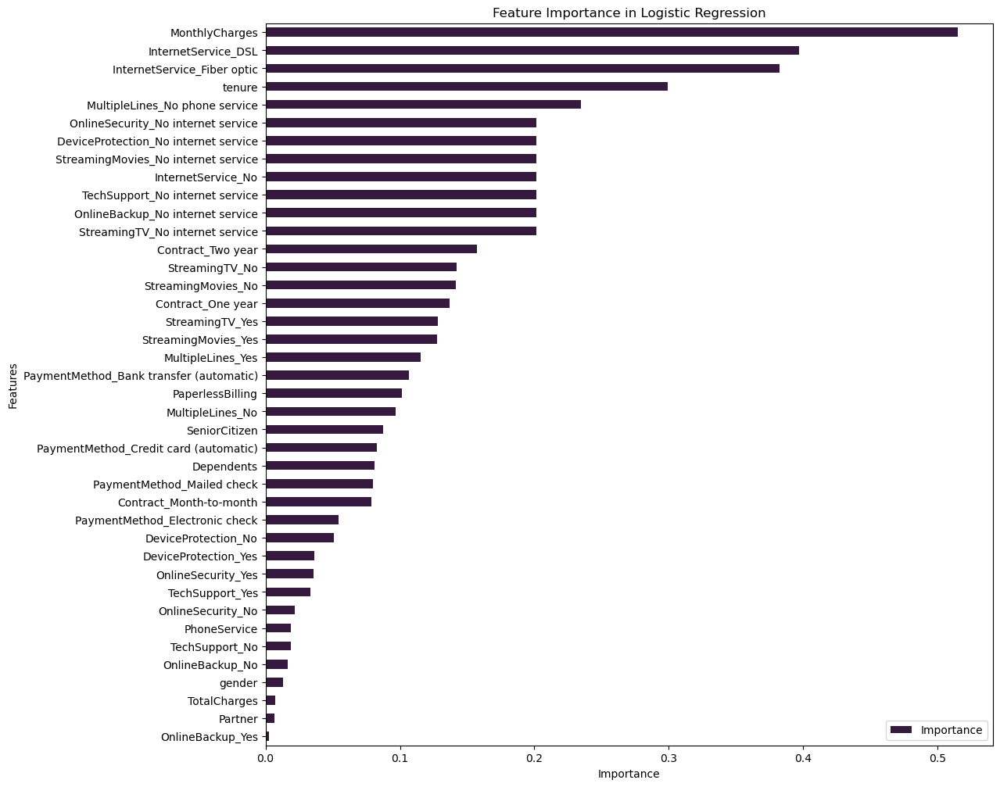

In [494]:
coefficients = psm.coef_[0]  # Extract coefficients
sns.set_palette('rocket')
# Create a DataFrame for viewing feature importance
feature_importance = pd.DataFrame({
    'Feature': X_train_final.columns,  # Feature names
    'Importance': np.abs(coefficients)  # Absolute value of coefficients to measure impact
})
feature_importance = feature_importance.sort_values(by='Importance', ascending=True)

# Plotting
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(12, 12))
plt.title('Feature Importance in Logistic Regression')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()


In [495]:
metrics_df.append({'Model': 'SVM', 'F1 Score': test_f1_svm, 'Accuracy': test_acc_svm })

In [496]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, f1_score

# Fit a decision tree on the development data
tree = DecisionTreeClassifier(random_state=0)
tree.fit(X_train_final, y_train)
# Make predictions on the development and test sets
y_train_pred = tree.predict(X_train_final)
y_test_pred = tree.predict(X_test_final)
# Calculate accuracy and F1 score on the development and test sets
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)
train_f1_score = f1_score(y_train, y_train_pred)
test_f1_score = f1_score(y_test, y_test_pred)
print("Development set accuracy:", train_accuracy)
print("Test set accuracy:", test_accuracy)
print("Development set F1 score:", train_f1_score)
print("Test set F1 score:", test_f1_score)

Development set accuracy: 0.9987555555555555
Test set accuracy: 0.7348969438521677
Development set F1 score: 0.9976549413735344
Test set F1 score: 0.5085638998682477


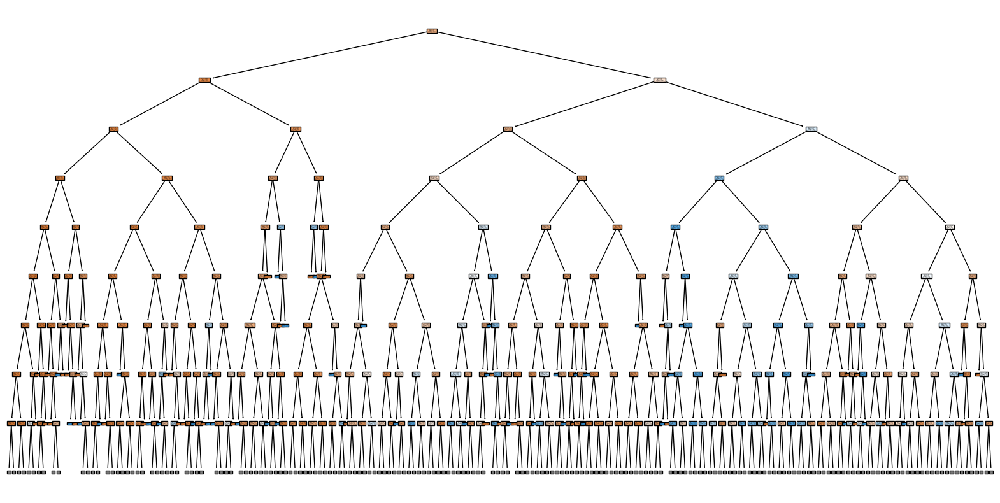

In [497]:
import matplotlib.pyplot as plt 
from sklearn.tree import plot_tree
# visualize the tree plot until the max_depth 8
plt.figure(figsize=(20,10))
plot_tree(tree, max_depth=8 ,filled=True)
plt.show()

Using Pruning

In [498]:
path = tree.cost_complexity_pruning_path(X_train_final, y_train)

ccp_alphas = path['ccp_alphas']
params = {'ccp_alpha': ccp_alphas}
clf = GridSearchCV(tree, params, cv=5)
clf.fit(X_train_final, y_train)

# Train a decision tree with the optimal alpha value
best_alpha = clf.best_params_['ccp_alpha']
pruned_tree = DecisionTreeClassifier(ccp_alpha=best_alpha, random_state=0)
pruned_tree.fit(X_train_final, y_train)

# Make predictions on the development and test sets using the pruned tree
y_train_pred = pruned_tree.predict(X_train_final)
y_test_pred = pruned_tree.predict(X_test_final)

# Calculate accuracy and F1 score on the development and test sets
dev_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy_dt = accuracy_score(y_test, y_test_pred)
dev_f1_score = f1_score(y_train, y_train_pred)
test_f1_score_dt = f1_score(y_test, y_test_pred)

print("Development set accuracy:", dev_accuracy)
print("Test set accuracy:", test_accuracy_dt)
print("Development set F1 score:", dev_f1_score)
print("Test set F1 score:", test_f1_score_dt)
print("Best value of alpha:", best_alpha)

Development set accuracy: 0.8106666666666666
Test set accuracy: 0.7903340440653873
Development set F1 score: 0.6162162162162163
Test set F1 score: 0.5718432510885341
Best value of alpha: 0.0007412287775182339


In [499]:
metrics_df.append({'Model': 'Decision Trees', 'F1 Score': test_f1_score_dt, 'Accuracy': test_accuracy_dt})

In [500]:
# Get feature importances from the trained decision tree model
importances = pruned_tree.feature_importances_

# Create a dictionary of feature importance scores with their corresponding column names
feature_importances = dict(zip(X_train_final.columns, importances)) # Sort the features by their importance scores (descending order)

sorted_features = sorted(feature_importances.items(), key=lambda x: x[1], reverse=True)
# Print the top 3 most important features
print("Top 3 most important features:")
for feature, importance in sorted_features[:3]:
    print(f"{feature}: {importance}")

Top 3 most important features:
Contract_Month-to-month: 0.5201756011563858
InternetService_Fiber optic: 0.15058269823500967
TotalCharges: 0.1350102851491256


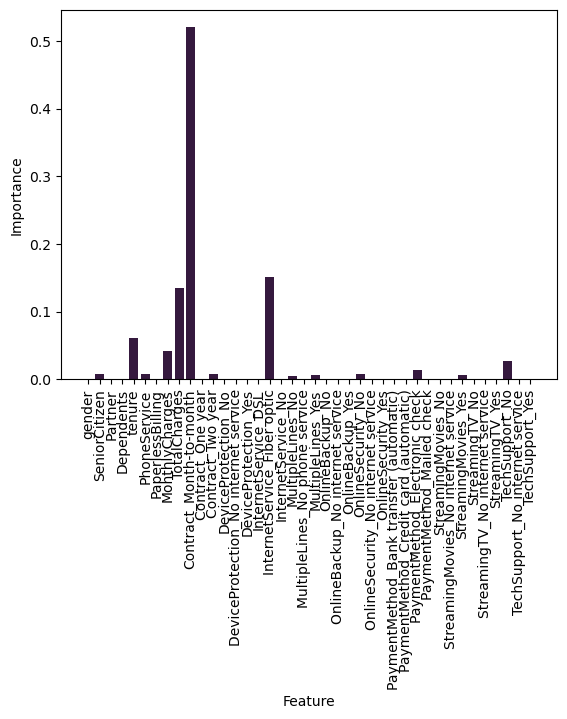

In [501]:
import matplotlib.pyplot as plt # Get the feature importances
importances = pruned_tree.feature_importances_ # Get the names of the features
feature_names = X_train_final.columns
plt.bar(feature_names, importances)
plt.xticks(rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.show()

## Random Forest

In [502]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score
# Train a Random Forest model on the development set
rf = RandomForestClassifier(random_state=0)
rf.fit(X_train_final, y_train)

# Make predictions on the development and test sets using the Random Forest model
y_train_pred = rf.predict(X_train_final)
y_test_pred = rf.predict(X_test_final)

# Calculate accuracy and F1 score on the development and test sets
dev_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy_rf = accuracy_score(y_test, y_test_pred)
dev_f1_score = f1_score(y_train, y_train_pred)
test_f1_score_rf = f1_score(y_test, y_test_pred)

print("Development set accuracy:", dev_accuracy)
print("Test set accuracy:", test_accuracy)
print("Development set F1 score:", dev_f1_score)
print("Test set F1 score:", test_f1_score)

Development set accuracy: 0.9987555555555555
Test set accuracy: 0.7348969438521677
Development set F1 score: 0.9976565115500502
Test set F1 score: 0.5085638998682477


In [503]:
# Get all trees in the random forest model 
trees = rf.estimators_
# Check if all trees have pure leaves
# iterates over each tree and checks if the maximum impurity score in each tree is zero, which.... # indicates that all the leaves in that tree are pure. The all function returns True if all the... # trees have pure leaves and False if at least one tree does not
all_pure = all(tree.tree_.impurity.max() == 0 for tree in trees)

if all_pure:
   print("All trees in random forest have pure leaves")
else:
   print("Not all trees in random forest have pure leaves")

test_accuracy = rf.score(X_test_final, y_test)
print("Mean accuracy score of the random forest on test set:", test_accuracy)

Not all trees in random forest have pure leaves
Mean accuracy score of the random forest on test set: 0.7775408670931059


In [504]:
metrics_df.append({'Model': 'Random Forest', 'F1 Score': test_f1_score_rf, 'Accuracy': test_accuracy_rf})

## XGBoost

In [505]:
X_train_final["SeniorCitizen"] = X_train_final["SeniorCitizen"].astype('int64')

In [506]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
import time
# Define the range of hyperparameters to tune
param_grid = {
'max_depth': [3, 5, 7],
'n_estimators': [50, 100, 150],
'learning_rate': [0.1, 0.01, 0.001]
}
# Create an XGBoost model
xgb = XGBClassifier()
# Perform a grid search to find the optimal hyperparameters
start_time = time.time()
xgb_grid = GridSearchCV(xgb, param_grid, cv=5, n_jobs=-1)
xgb_grid.fit(X_train_final, y_train)
end_time = time.time()
# Print the optimal hyperparameters
print("Optimal hyperparameters:", xgb_grid.best_params_)
# Train a new XGBoost model with the optimal hyperparameters on the entire training dataset
optimal_xgb = XGBClassifier(**xgb_grid.best_params_)
optimal_xgb.fit(X_train_final, y_train)
# X_test_encoded = X_test_encoded[X_dev_encoded.columns]
# Evaluate the performance of the model on the training and test datasets 
train_accuracy_xgb = optimal_xgb.score(X_train_final, y_train)
# print(X_test_encoded.shape)
# print(y_test.shape)
test_accuracy_xgb = optimal_xgb.score(X_test_final, y_test)
# test_accuracy_xgb = accuracy_score(y_test, optimal_xgb.predict(X_test_encoded) )
train_f1_xgb = f1_score(y_train, optimal_xgb.predict(X_train_final))
test_f1_xgb = f1_score(y_test, optimal_xgb.predict(X_test_final))

python(13697) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(13698) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(13699) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(13700) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(13701) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(13702) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(13703) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(13704) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(13705) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(13706) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(13707) Malloc

Optimal hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}


In [507]:
print("Training set accuracy:", train_accuracy_xgb)
print("Test set accuracy:", test_accuracy_xgb)
print("Training set F1 score:", train_f1_xgb)
print("Test set F1 score:", test_f1_xgb)
print("Time taken for model selection: {} seconds".format(end_time - start_time))

Training set accuracy: 0.8224
Test set accuracy: 0.7960199004975125
Training set F1 score: 0.6284864261807364
Test set F1 score: 0.5822416302765647
Time taken for model selection: 3.010305881500244 seconds


In [508]:
metrics_df.append({'Model': 'XGBoost', 'F1 Score': test_f1_xgb, 'Accuracy': test_accuracy_xgb})

In [509]:
# Get feature importances from the trained XGBOOST model
importances = optimal_xgb.feature_importances_
# Create a dictionary of feature importance scores with their corresponding column names
feature_importances = dict(zip(X_train_final.columns, importances)) # Sort the features by their importance scores (descending order)
sorted_features = sorted(feature_importances.items(), key=lambda x: x[1], reverse=True)
# Print the top 3 most important features
print("Top 3 most important features:")
for feature, importance in sorted_features[:3]:
    print(f"{feature}: {importance}")

Top 3 most important features:
Contract_Month-to-month: 0.5088824033737183
InternetService_Fiber optic: 0.12097691744565964
TechSupport_No: 0.09084522724151611


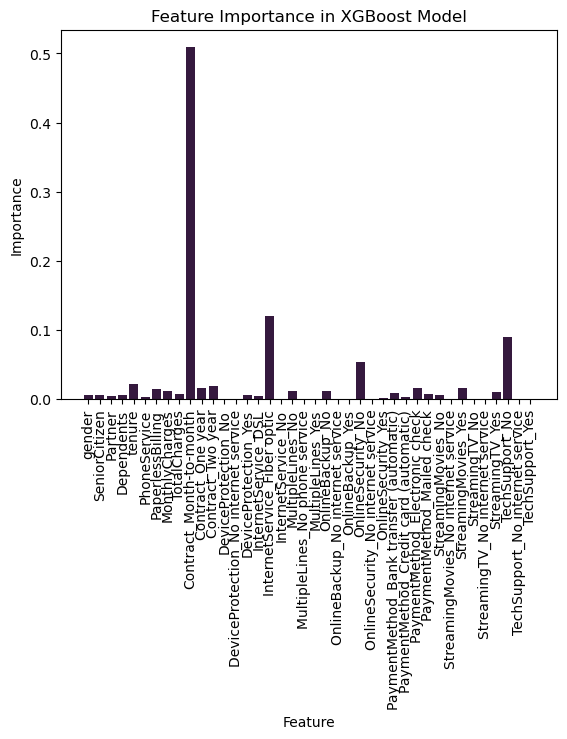

In [510]:
# Get the feature importances
importances = optimal_xgb.feature_importances_ # Get the names of the features
feature_names = X_train_final.columns
plt.bar(feature_names, importances)
plt.xticks(rotation=90) 
plt.title('Feature Importance in XGBoost Model')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.show()

## CatBoost

In [ ]:
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV
import time
# Define the range of hyperparameters to tune
param_grid = {
'max_depth': [3, 5, 7],
'n_estimators': [50, 100, 150],
'learning_rate': [0.1, 0.01, 0.001]
}
# Create an XGBoost model
cat = CatBoostClassifier()
# Perform a grid search to find the optimal hyperparameters
start_time = time.time()
cat_grid = GridSearchCV(cat, param_grid, cv=5, n_jobs=-1)
cat_grid.fit(X_train_final, y_train)
end_time = time.time()
# Print the optimal hyperparameters
print("Optimal hyperparameters:", cat_grid.best_params_)
# Train a new XGBoost model with the optimal hyperparameters on the entire training dataset
optimal_cat = XGBClassifier(**cat_grid.best_params_)
optimal_cat.fit(X_train_final, y_train)
# X_test_encoded = X_test_encoded[X_dev_encoded.columns]
# Evaluate the performance of the model on the training and test datasets 
train_accuracy_cat= optimal_cat.score(X_train_final, y_train)
# print(X_test_encoded.shape)
# print(y_test.shape)
test_accuracy_cat= optimal_cat.score(X_test_final, y_test)
# test_accuracy_xgb = accuracy_score(y_test, optimal_xgb.predict(X_test_encoded) )
train_f1_cat= f1_score(y_train, optimal_cat.predict(X_train_final))
test_f1_cat = f1_score(y_test, optimal_cat.predict(X_test_final))

In [512]:
# Optimal hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50}
print("Training set accuracy:", train_accuracy_cat)
print("Test set accuracy:", test_accuracy_cat)
print("Training set F1 score:", train_f1_cat)
print("Test set F1 score:", test_f1_cat)
print("Time taken for model selection: {} seconds".format(end_time - start_time))

Training set accuracy: 0.8360888888888889
Test set accuracy: 0.7967306325515281
Training set F1 score: 0.6564828614008942
Test set F1 score: 0.5855072463768116
Time taken for model selection: 6.967976093292236 seconds


In [513]:
metrics_df.append({'Model': 'CatBoost', 'F1 Score': test_f1_cat, 'Accuracy': test_accuracy_cat})

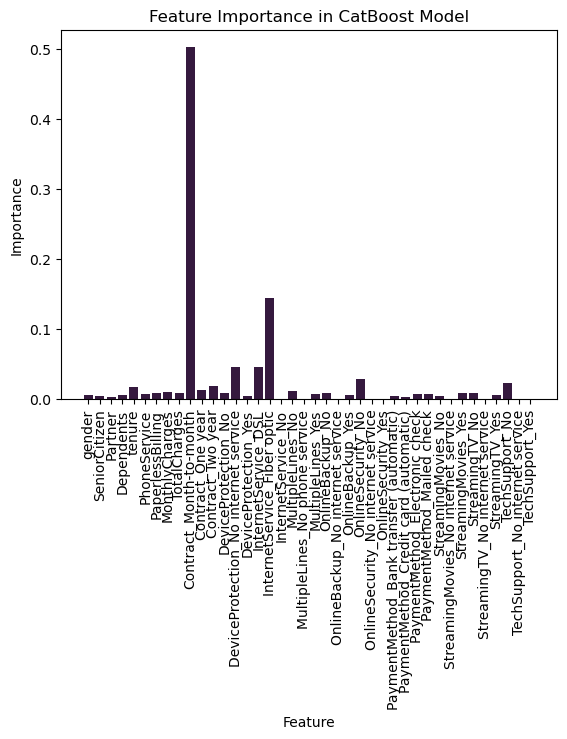

In [514]:
# Get the feature importances
importances = optimal_cat.feature_importances_ # Get the names of the features
feature_names = X_train_final.columns
plt.bar(feature_names, importances)
plt.xticks(rotation=90) 
plt.title('Feature Importance in CatBoost Model')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.show()

## AdaBoost

In [515]:
from sklearn.ensemble import AdaBoostClassifier
ada_model = AdaBoostClassifier()
# n_estimators = 50 (default value) 
# base_estimator = DecisionTreeClassifier (default value)


ada_model.fit(X_train_final,y_train)
y_train_pred = ada_model.predict(X_train_final)
y_test_pred = ada_model.predict(X_test_final)

train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)
train_f1_score = f1_score(y_train, y_train_pred)
test_f1_score = f1_score(y_test, y_test_pred)
print("Development set accuracy:", train_accuracy)
print("Test set accuracy:", test_accuracy)
print("Development set F1 score:", train_f1_score)
print("Test set F1 score:", test_f1_score)



Development set accuracy: 0.8085333333333333
Test set accuracy: 0.7924662402274343
Development set F1 score: 0.5985836749906821
Test set F1 score: 0.5743440233236151


/opt/homebrew/Caskroom/miniconda/base/envs/dsproj/lib/python3.9/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



In [516]:
param_grid = {
'n_estimators': [50, 100, 200],
'learning_rate': [0.05, 0.1, 0.5]
}
# Create an XGBoost model
ada = AdaBoostClassifier()
# Perform a grid search to find the optimal hyperparameters
start_time = time.time()
ada_grid = GridSearchCV(ada, param_grid, cv=5, n_jobs=-1)
ada_grid.fit(X_train_final, y_train)
end_time = time.time()
# Print the optimal hyperparameters
print("Optimal hyperparameters:", ada_grid.best_params_)
# Train a new XGBoost model with the optimal hyperparameters on the entire training dataset
optimal_ada = XGBClassifier(**ada_grid.best_params_)
optimal_ada.fit(X_train_final, y_train)
# X_test_encoded = X_test_encoded[X_dev_encoded.columns]
# Evaluate the performance of the model on the training and test datasets 
train_accuracy_ada = optimal_ada.score(X_train_final, y_train)
# print(X_test_encoded.shape)
# print(y_test.shape)
test_accuracy_ada= optimal_ada.score(X_test_final, y_test)
# test_accuracy_xgb = accuracy_score(y_test, optimal_xgb.predict(X_test_encoded) )
train_f1_ada= f1_score(y_train, optimal_ada.predict(X_train_final))
test_f1_ada = f1_score(y_test, optimal_ada.predict(X_test_final))

print("Training set accuracy:", train_accuracy_ada)
print("Test set accuracy:", test_accuracy_ada)
print("Training set F1 score:", train_f1_ada)
print("Test set F1 score:", test_f1_ada)
print("Time taken for model selection: {} seconds".format(end_time - start_time))

/opt/homebrew/Caskroom/miniconda/base/envs/dsproj/lib/python3.9/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/homebrew/Caskroom/miniconda/base/envs/dsproj/lib/python3.9/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/homebrew/Caskroom/miniconda/base/envs/dsproj/lib/python3.9/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/homebrew/Caskroom/miniconda/base/envs/dsproj/lib/python3.9/site-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The SAMME.R algorit

Optimal hyperparameters: {'learning_rate': 0.5, 'n_estimators': 100}
Training set accuracy: 0.9738666666666667
Test set accuracy: 0.7683013503909026
Training set F1 score: 0.9507867425510546
Test set F1 score: 0.5521978021978022
Time taken for model selection: 2.9089019298553467 seconds


In [517]:
metrics_df.append({'Model': 'Adaboost', 'F1 Score': test_f1_ada, 'Accuracy': test_accuracy_ada})

## Model performance visualization

In [518]:
# Convert the list of dictionaries to a DataFrame
metrics_df = pd.DataFrame(metrics_df)

In [519]:
metrics_df

,Model,F1 Score,Accuracy
0,Logistic Regression,0.609929,0.609929
1,SVM,0.601719,0.802416
2,Decision Trees,0.571843,0.790334
3,Random Forest,0.527903,0.777541
4,XGBoost,0.582242,0.796020
5,CatBoost,0.585507,0.796731
6,Adaboost,0.552198,0.768301


In [520]:
metrics_melted = metrics_df.melt(id_vars='Model', value_vars=['F1 Score', 'Accuracy'], 
                                 var_name='Metric', value_name='Score')

metrics_melted

,Model,Metric,Score
0,Logistic Regression,F1 Score,0.609929
1,SVM,F1 Score,0.601719
2,Decision Trees,F1 Score,0.571843
3,Random Forest,F1 Score,0.527903
4,XGBoost,F1 Score,0.582242
5,CatBoost,F1 Score,0.585507
6,Adaboost,F1 Score,0.552198
7,Logistic Regression,Accuracy,0.609929
8,SVM,Accuracy,0.802416
9,Decision Trees,Accuracy,0.790334


In [521]:
# Sort the DataFrame by score in descending order
metrics_melted = metrics_melted.sort_values(by='Score', ascending=False)

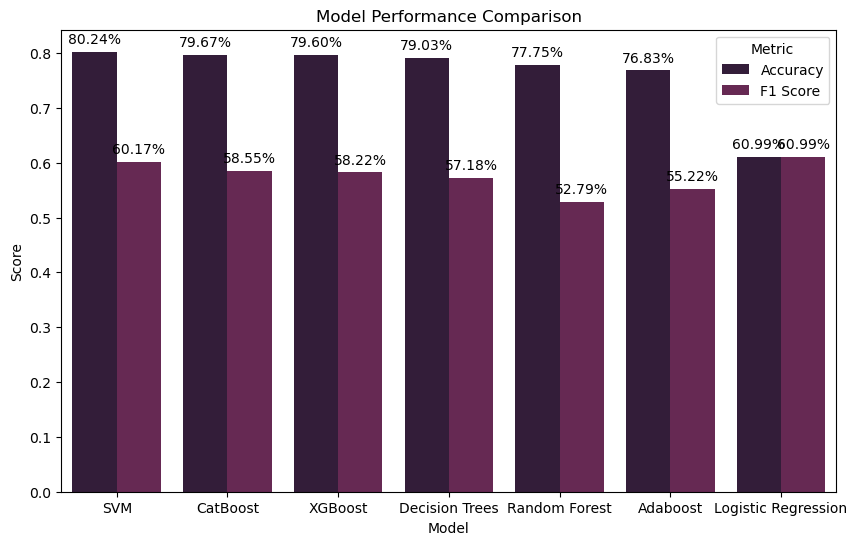

In [522]:
# Visualize the data using Seaborn
# Annotate the bars with the percentage values
plt.figure(figsize=(10, 6))

ax = sns.barplot(x='Model', y='Score', hue='Metric', data=metrics_melted)
for p in ax.patches:
    ax.annotate(f'{p.get_height()*100:.2f}%', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 9), textcoords='offset points')

plt.title('Model Performance Comparison')
plt.xlabel('Model')
plt.ylabel('Score')
plt.legend(title='Metric')
plt.show()

## Conclusion

The analysis demonstrates that Logistic Regression, with appropriate hyperparameter tuning, provides the best balance of precision and recall for predicting customer churn in this dataset. While other models like SVM show comparable performance, ensemble methods did not perform as expected. Future work could involve exploring deeper hyperparameter tuning, feature engineering, or even more sophisticated models to improve performance further. Moreover, addressing the class imbalance issue more effectively through techniques such as SMOTE (Synthetic Minority Over-sampling Technique) could also be beneficial.
 
## Recommendations

1.	Model Deployment: Implement the logistic regression model with the tuned hyperparameters for practical application.
2.	Further Research: Explore advanced techniques like ensemble stacking or neural networks.
3.	Data Strategy: Regularly update the model with new data to maintain performance and adapt to changing customer behaviors.
4.	Customer Retention: Use insights from feature importance to focus on key factors influencing churn, such as contract types and monthly charges, to develop targeted retention strategies.
